# <center> <i>Predictive Analytics</i>: Drought Level Classification using Meteorological and Soil Data </center>
--- 

<small>by: Muhammad Difagama Ivanka</small>

# *Preview*

Dianjurkan menjalankan dengan Google Colaboratory (berkaitan dengan file management)

`WARNING!!: File dataset cukup berat sehingga membutuhkan kesabaran jika ingin run full dari awal (± 3-4 jam)`

<p align="center">
  <img width="460" height="300" src="https://user-images.githubusercontent.com/59215827/137079905-72dcbb55-bd12-47c1-9f1a-ea89dffea504.jpg" alt="Source: https://unsplash.com/photos/8wuOLdN77A4">
</p>

[<center><sub><sup>image source</sup></sub></center>](https://unsplash.com/photos/8wuOLdN77A4)

# 1.&nbsp;Sumber Dataset

## Menginstall Package 

In [30]:
# !pip install -q kaggle
!pip install --upgrade --force-reinstall --no-deps kaggle
!pip install -U --no-deps plotly
!pip install --no-deps scikit-optimize

  Using cached kaggle-1.5.12-py3-none-any.whl
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12


## Upload file kaggle.json (api kaggle token) dari pengaturan akun,
1. klik 'expire api token'
2. 'create new token' (auto download)

In [ ]:
from google.colab import files

!rm -r -f -- kaggle.json
files.upload()

{}

## Mengcopy api ke folder yang tepat

In [ ]:
# !rm -r -f -- ~/.kaggle/kaggle.json
!rm -rf ~/.kaggle
!mkdir ~/.kaggle/

!cp kaggle.json ~/.kaggle/

# Mengganti permission
!chmod 600 ~/.kaggle/kaggle.json

# Unduh dataset
!rm -r -f -- test_timeseries.csv.zip
!rm -r -f -- soil_data.csv.zip
!kaggle datasets download -f validation_timeseries/validation_timeseries.csv -d cdminix/us-drought-meteorological-data
!kaggle datasets download -f test_timeseries/test_timeseries.csv -d cdminix/us-drought-meteorological-data
!kaggle datasets download -f soil_data.csv -d cdminix/us-drought-meteorological-data
!kaggle datasets download -f us_county.csv -d headsortails/covid19-us-county-jhu-data-demographics
!kaggle datasets download -d zeeniye/us-climate-regions

 94% 81.0M/86.1M [00:03<00:00, 28.0MB/s]
100% 86.1M/86.1M [00:03<00:00, 23.2MB/s]
 96% 83.0M/86.4M [00:04<00:00, 22.3MB/s]
100% 86.4M/86.4M [00:04<00:00, 19.0MB/s]
  0% 0.00/714k [00:00<?, ?B/s]
100% 714k/714k [00:00<00:00, 102MB/s]
  0% 0.00/348k [00:00<?, ?B/s]
100% 348k/348k [00:00<00:00, 31.6MB/s]
  0% 0.00/450 [00:00<?, ?B/s]
100% 450/450 [00:00<00:00, 417kB/s]


In [ ]:
# !kaggle datasets download -d cdminix/us-drought-meteorological-data

## Direktori penempatan dataset setelah terunduh

In [ ]:
!mkdir dataset
!unzip validation_timeseries.csv.zip -d dataset
!unzip test_timeseries.csv.zip -d dataset
!unzip us-climate-regions.zip -d dataset
!mv -i soil_data.csv dataset
!mv -i us_county.csv dataset

Archive:  validation_timeseries.csv.zip
  inflating: dataset/validation_timeseries.csv  
Archive:  test_timeseries.csv.zip
  inflating: dataset/test_timeseries.csv  
Archive:  us-climate-regions.zip
  inflating: dataset/us_climate_regions.csv  


# 2.&nbsp;*Data Preprocessing*

Detail | Keterangan
-- | --
Source | [Kaggle: Predict Droughts using Weather & Soil Data](https://www.kaggle.com/cdminix/us-drought-meteorological-data)
License | [Public (CC0 1.0)](https://creativecommons.org/publicdomain/zero/1.0/)
Format | zip (&pm;172 MB)
Domain | Weather, Climate, Earth Science, Environment
Timeframe | 2017/01/01 s.d. 2020/12/31
Supplementary Data | [us_county.csv](https://www.kaggle.com/headsortails/covid19-us-county-jhu-data-demographics?select=us_county.csv) <br><br> [us_climate_region.csv](https://www.kaggle.com/zeeniye/us-climate-regions?select=us_climate_regions.csv)

## Cek data original

In [ ]:
import numpy as np
import pandas as pd
np.random.seed(233)

data = pd.read_csv('dataset/test_timeseries.csv')
data2 = pd.read_csv('dataset/validation_timeseries.csv')
soil = pd.read_csv('dataset/soil_data.csv')
uscty = pd.read_csv('dataset/us_county.csv')
usclr = pd.read_csv('dataset/us_climate_regions.csv')

data2.shape, data.shape, soil.shape

((2268840, 21), (2271948, 21), (3109, 32))

## Gabung data Meteorological

In [ ]:
meteo = pd.concat([data2, data], axis=0).reset_index(drop=True)
meteo.shape

(4540788, 21)

## Filter hanya data yang benar2 menunjukkan tingkat kekeringan secara bulat (5 level)

hal ini langsung dilakukan diawal agar dapat sesuai sampel data yang dibutuhkan dan untuk meringankan komputasi baik dari waktu serta memori.

In [ ]:
train = meteo[(meteo.score == 0.0) | (meteo.score==1.0) | \
      (meteo.score==2.0) | (meteo.score==3.0) | (meteo.score==4.0)]

train.loc[:, 'score'] = train.score.astype('int')

# # exclude data before 2019 for 'D0' class
# train = train[~((train.loc[:, 'date'] <= '2018-12-31') & (train.loc[:, 'score'] == 0))]

train.loc[:, 'score'].value_counts()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


0    414407
1     32521
2     14251
3      5210
4      1975
Name: score, dtype: int64

## Infer Season dari Date

untuk melihat [musim](https://www.calendardate.com/year2020.php) secara [meteorological](https://www.ukgardening.co.uk/planting-seasons.php) menggunakan bulan (karena ditambahnkan early, mid, late untuk tiap musim)

In [ ]:
# Split informasi pada date terutama tanggal dan bulan (untuk melihat musim)
train.loc[:, 'date'] = pd.to_datetime(train.loc[:, 'date'])
# train.loc[:, 'day'] = train.date.apply(lambda x: x.day)
train.loc[:, 'month'] = train.loc[:, 'date'].apply(lambda x: x.month)

# Reset index untuk mempermudah indexing
train = train.reset_index(drop=True)
train.columns

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


Index(['fips', 'date', 'PRECTOT', 'PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET',
       'T2M_MAX', 'T2M_MIN', 'T2M_RANGE', 'TS', 'WS10M', 'WS10M_MAX',
       'WS10M_MIN', 'WS10M_RANGE', 'WS50M', 'WS50M_MAX', 'WS50M_MIN',
       'WS50M_RANGE', 'score', 'month'],
      dtype='object')

## Menambahkan informasi US Climate Region <sup>[source](https://www.ncdc.noaa.gov/monitoring-references/maps/us-climate-regions.php)</sup>

serta melakukan drop 400 baris yang terdapat nan values pada kolom `state_code`

In [ ]:
train = train.merge(uscty.loc[:, ['state_code', 'fips']], on='fips', how='left')

# area yang tidak diketahui states-nya
train[train.state_code.isna()].fips.unique()

array([11001, 51515])

In [ ]:
# drop nan values
train = train.dropna().reset_index(drop=True)

# penambahan climate regions
train = train.merge(usclr.loc[:, ['state_code', 'climate_regions']], on='state_code', how='left')
train

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score,month,state_code,climate_regions
0,1001,2017-01-03,18.82,99.69,9.74,14.24,13.44,13.44,18.48,9.29,9.20,14.06,2.25,3.73,1.64,2.09,4.80,7.27,2.54,4.72,2,1,AL,SOUTHEAST
1,1001,2017-01-10,0.02,101.13,5.62,5.92,4.54,4.55,12.42,-2.37,14.79,5.81,3.22,4.24,2.52,1.72,6.19,7.55,4.68,2.86,2,1,AL,SOUTHEAST
2,1001,2017-01-17,0.14,100.60,11.41,17.21,16.06,16.06,23.03,13.15,9.88,17.10,2.24,3.61,1.71,1.90,4.93,5.90,2.76,3.15,2,1,AL,SOUTHEAST
3,1001,2017-01-24,0.00,99.72,5.60,9.27,5.34,5.35,16.23,4.18,12.06,8.95,1.82,2.34,1.03,1.31,3.52,6.49,1.47,5.02,1,1,AL,SOUTHEAST
4,1001,2017-01-31,0.00,100.37,7.31,11.38,9.21,9.21,20.29,5.05,15.24,11.32,2.31,3.00,1.76,1.24,5.00,7.40,2.88,4.52,1,1,AL,SOUTHEAST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467959,56043,2020-04-28,0.33,83.54,3.92,8.74,-2.14,-2.26,14.28,3.06,11.22,9.03,5.04,9.76,1.22,8.54,6.82,11.75,1.66,10.09,0,4,WY,NORTHEN ROCKIES AND PLAINS (WEST NORTH CENTRAL)
467960,56043,2020-06-02,0.33,83.48,8.59,18.92,9.00,8.96,24.11,12.46,11.65,20.39,2.47,3.89,1.66,2.23,3.72,7.56,1.85,5.71,1,6,WY,NORTHEN ROCKIES AND PLAINS (WEST NORTH CENTRAL)
467961,56043,2020-06-16,1.13,82.50,6.45,17.64,4.57,4.50,26.29,11.10,15.19,17.80,4.59,11.06,1.15,9.92,6.43,13.50,1.97,11.53,2,6,WY,NORTHEN ROCKIES AND PLAINS (WEST NORTH CENTRAL)
467962,56043,2020-06-23,0.01,83.48,7.16,20.98,6.23,6.26,29.08,10.99,18.09,23.34,2.11,3.10,1.17,1.93,3.28,6.04,1.22,4.82,2,6,WY,NORTHEN ROCKIES AND PLAINS (WEST NORTH CENTRAL)


## Merge Soil Data

In [ ]:
merge_cols = train.loc[:, ['fips', 'date', 'score']]
soil2 = merge_cols.merge(soil, how='left', on='fips')
soil2

,fips,date,score,lat,lon,elevation,slope1,slope2,slope3,slope4,slope5,slope6,slope7,slope8,aspectN,aspectE,aspectS,aspectW,aspectUnknown,WAT_LAND,NVG_LAND,URB_LAND,GRS_LAND,FOR_LAND,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7
0,1001,2017-01-03,2,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.2889,2.750274,10.714703,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
1,1001,2017-01-10,2,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.2889,2.750274,10.714703,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
2,1001,2017-01-17,2,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.2889,2.750274,10.714703,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
3,1001,2017-01-24,1,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.2889,2.750274,10.714703,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
4,1001,2017-01-31,1,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.2889,2.750274,10.714703,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467959,56043,2020-04-28,0,43.878831,-107.669052,1417,0.0034,0.0470,0.2331,0.4099,0.2064,0.0999,0.0003,0.0,0.2552,0.2011,0.1525,0.3408,0.0504,0.0000,33.000000,0.0000,67.000000,0.000000,0.000000,0.000000,0.000000,1,1,1,1,1,1,1
467960,56043,2020-06-02,1,43.878831,-107.669052,1417,0.0034,0.0470,0.2331,0.4099,0.2064,0.0999,0.0003,0.0,0.2552,0.2011,0.1525,0.3408,0.0504,0.0000,33.000000,0.0000,67.000000,0.000000,0.000000,0.000000,0.000000,1,1,1,1,1,1,1
467961,56043,2020-06-16,2,43.878831,-107.669052,1417,0.0034,0.0470,0.2331,0.4099,0.2064,0.0999,0.0003,0.0,0.2552,0.2011,0.1525,0.3408,0.0504,0.0000,33.000000,0.0000,67.000000,0.000000,0.000000,0.000000,0.000000,1,1,1,1,1,1,1
467962,56043,2020-06-23,2,43.878831,-107.669052,1417,0.0034,0.0470,0.2331,0.4099,0.2064,0.0999,0.0003,0.0,0.2552,0.2011,0.1525,0.3408,0.0504,0.0000,33.000000,0.0000,67.000000,0.000000,0.000000,0.000000,0.000000,1,1,1,1,1,1,1


## Informasi dasar dataset

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 467964 entries, 0 to 467963
Data columns (total 24 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   fips             467964 non-null  int64         
 1   date             467964 non-null  datetime64[ns]
 2   PRECTOT          467964 non-null  float64       
 3   PS               467964 non-null  float64       
 4   QV2M             467964 non-null  float64       
 5   T2M              467964 non-null  float64       
 6   T2MDEW           467964 non-null  float64       
 7   T2MWET           467964 non-null  float64       
 8   T2M_MAX          467964 non-null  float64       
 9   T2M_MIN          467964 non-null  float64       
 10  T2M_RANGE        467964 non-null  float64       
 11  TS               467964 non-null  float64       
 12  WS10M            467964 non-null  float64       
 13  WS10M_MAX        467964 non-null  float64       
 14  WS10M_MIN        467

In [ ]:
soil2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 467964 entries, 0 to 467963
Data columns (total 34 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   fips           467964 non-null  int64         
 1   date           467964 non-null  datetime64[ns]
 2   score          467964 non-null  int64         
 3   lat            467964 non-null  float64       
 4   lon            467964 non-null  float64       
 5   elevation      467964 non-null  int64         
 6   slope1         467964 non-null  float64       
 7   slope2         467964 non-null  float64       
 8   slope3         467964 non-null  float64       
 9   slope4         467964 non-null  float64       
 10  slope5         467964 non-null  float64       
 11  slope6         467964 non-null  float64       
 12  slope7         467964 non-null  float64       
 13  slope8         467964 non-null  float64       
 14  aspectN        467964 non-null  float64       
 15  

## Informasi statistik dasar kolom continous

In [ ]:
train.drop(['fips', 'score', 'month', 'state_code', 'climate_regions'], axis=1).describe(datetime_is_numeric=True).T

,count,mean,min,25%,50%,75%,max,std
date,467964,2018-12-31 07:27:25.880636928,2017-01-03 00:00:00,2018-01-09 00:00:00,2019-01-22 00:00:00,2019-12-17 00:00:00,2020-12-29 00:00:00,NaN
PRECTOT,467964,2.94081,0,0.01,0.24,2.79,178.54,6.47765
PS,467964,97.309,67.27,96.6,98.46,100.02,104.01,4.6313
QV2M,467964,8.31614,0.15,3.96,7.29,12.38,21.8,5.00083
T2M,467964,12.5079,-34.69,4.09,13.67,21.92,38.7,10.8759
T2MDEW,467964,7.91105,-37.84,-0.09,8.71,17.07,26.71,10.5102
T2MWET,467964,7.92139,-34.83,-0.08,8.57,16.97,26.62,10.3278
T2M_MAX,467964,17.9261,-28.35,9.47,19.69,27.33,46.52,11.3745
T2M_MIN,467964,7.48849,-41.96,-0.74,8.01,16.6,31.38,10.7007
T2M_RANGE,467964,10.4377,0.16,7.81,10.35,12.93,29.34,3.72045


In [ ]:
soil2.drop(['fips', 'lat', 'lon', 'score',\
            'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'], axis=1).describe(datetime_is_numeric=True).T

,count,mean,min,25%,50%,75%,max,std
date,467964,2018-12-31 07:27:25.880636928,2017-01-03 00:00:00,2018-01-09 00:00:00,2019-01-22 00:00:00,2019-12-17 00:00:00,2020-12-29 00:00:00,NaN
elevation,467964,370.576,-1,126,260,414,3561,424.178
slope1,467964,0.053958,0,0.0081,0.0274,0.0661,0.974,0.0893824
slope2,467964,0.291418,0,0.1002,0.261,0.4685,0.7599,0.213404
slope3,467964,0.319225,0,0.1866,0.3457,0.4575,0.6969,0.166669
slope4,467964,0.159721,0,0.0439,0.1332,0.2605,0.5717,0.129085
slope5,467964,0.0552631,0,0.0006,0.0131,0.0963,0.33,0.0745698
slope6,467964,0.0661555,0,0,0.0008,0.0563,0.6068,0.126723
slope7,467964,0.0211854,0,0,0,0.0012,0.4765,0.0626566
slope8,467964,0.00772686,0,0,0,0,0.6288,0.0401927


## Cek NAN values dan inkonsistensi data

In [ ]:
train[train.loc[:, ['date', 'fips', 'score']].duplicated()]

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score,month,state_code,climate_regions


In [ ]:
print('meteorological nan values count\t: ', train.isna().sum().sum())
print('soil info nan values count\t: ', soil2.isna().sum().sum())
# print('meteo inconsistency count\t: ', sum(train[train.date == '2019-01-01'].fips.value_counts().values > 1))
# print('soil info inconsistency count\t: ', sum(soil2[soil2.date == '2019-01-01'].fips.value_counts().values > 1))
print('meteo inconsistency2 count\t: ', train[train.loc[:, ['date', 'fips']].duplicated(keep='first')].sum().sum())
print('soil info inconsistency2 count\t: ', soil2[soil2.loc[:, ['date', 'fips']].duplicated(keep='first')].sum().sum())

meteorological nan values count	:  0
soil info nan values count	:  0
meteo inconsistency2 count	:  0.0
soil info inconsistency2 count	:  0.0


## Merge data Meteorological dan Soil

In [ ]:
full_train = pd.concat([train, soil2.iloc[:, 3:]], axis=1)
full_train = full_train.sort_values(by='date').reset_index(drop=True)
full_train

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score,month,state_code,climate_regions,lat,lon,elevation,slope1,slope2,slope3,slope4,slope5,slope6,slope7,slope8,aspectN,aspectE,aspectS,aspectW,aspectUnknown,WAT_LAND,NVG_LAND,URB_LAND,GRS_LAND,FOR_LAND,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7
0,1001,2017-01-03,18.82,99.69,9.74,14.24,13.44,13.44,18.48,9.29,9.20,14.06,2.25,3.73,1.64,2.09,4.80,7.27,2.54,4.72,2,1,AL,SOUTHEAST,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,0.0000,0.0000,0.1033,0.1859,0.2003,0.1898,0.3207,0.9974,27.940498,0.288900,2.750274,10.714703,5.629341e+01,1.014811,57.308224,1,1,1,1,1,1,2
1,40111,2017-01-03,0.03,99.22,3.93,3.97,-1.01,-0.92,8.48,-3.10,11.58,4.07,6.65,9.68,2.32,7.36,8.83,11.74,4.39,7.35,3,1,OK,SOUTH,35.646879,-95.964580,210,0.0537,0.5088,0.3813,0.0494,0.0064,0.0004,0.0000,0.0000,0.0820,0.1229,0.0839,0.1487,0.5625,0.0000,0.000000,0.639300,9.032773,44.753696,4.555259e+01,0.021646,45.574230,1,1,1,1,1,1,1
2,8083,2017-01-03,0.33,80.82,3.52,-1.15,-3.90,-3.88,2.93,-3.17,6.10,-1.60,2.36,3.35,0.76,2.59,3.85,5.80,1.44,4.35,0,1,CO,SOUTHWEST,37.338025,-108.595786,1987,0.0013,0.1002,0.2942,0.1779,0.0836,0.1515,0.0918,0.0995,0.3459,0.1365,0.0599,0.3562,0.1015,0.0000,0.636474,0.000000,8.723434,90.638786,0.000000e+00,0.001306,0.001306,1,1,2,1,1,1,1
3,40109,2017-01-03,0.07,98.15,2.87,1.71,-5.10,-4.90,7.24,-3.54,10.78,2.03,7.68,10.45,4.84,5.61,9.81,12.77,7.50,5.27,3,1,OK,SOUTH,35.554611,-97.409401,362,0.0513,0.4055,0.4850,0.0559,0.0021,0.0002,0.0000,0.0000,0.1317,0.1478,0.0745,0.1892,0.4568,0.0000,0.000000,47.011600,26.146481,6.121147,2.057229e+01,0.148478,20.720772,1,1,2,1,1,1,1
4,40107,2017-01-03,0.03,98.83,3.75,4.09,-1.51,-1.41,8.79,-2.46,11.24,4.26,7.07,10.34,2.48,7.85,9.24,12.45,4.96,7.49,3,1,OK,SOUTH,35.466804,-96.327762,265,0.0446,0.4284,0.4006,0.1119,0.0143,0.0002,0.0000,0.0000,0.1222,0.1524,0.0987,0.1537,0.4730,0.0000,0.000000,0.241200,17.266167,1.766819,8.059077e+01,0.135050,80.725815,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467959,5117,2020-12-29,0.27,101.47,5.31,6.17,4.82,5.49,11.10,1.58,9.52,6.08,4.29,5.78,2.87,2.91,6.73,9.63,3.30,6.33,1,12,AR,SOUTH,34.828225,-91.557200,68,0.1130,0.5807,0.2831,0.0232,0.0000,0.0000,0.0000,0.0000,0.0658,0.0877,0.0693,0.0835,0.6937,0.0000,0.000000,0.110200,1.119566,3.463838,3.916299e+01,56.143410,95.306396,1,1,1,2,1,1,1
467960,37099,2020-12-29,0.05,93.86,4.51,4.25,1.43,2.84,11.72,-1.06,12.77,4.16,1.67,2.44,1.06,1.38,3.47,5.03,1.53,3.50,0,12,NC,SOUTHEAST,35.286463,-83.130641,1085,0.0004,0.0042,0.0272,0.0801,0.0992,0.3915,0.3095,0.0879,0.2909,0.2530,0.1823,0.2692,0.0046,0.0000,0.000000,1.200756,19.742952,71.526382,7.313372e+00,0.216536,7.529909,3,2,2,1,1,1,2
467961,1093,2020-12-29,0.01,100.39,5.08,5.42,4.02,4.72,10.28,0.54,9.74,5.32,2.16,2.60,1.09,1.50,4.49,6.18,2.58,3.59,0,12,AL,SOUTHEAST,34.138219,-87.881551,193,0.0077,0.0937,0.2587,0.3193,0.2105,0.1075,0.0026,0.0000,0.2278,0.2010,0.2267,0.2431,0.1014,0.0000,0.000000,0.503664,8.909237,90.575363,9.313226e-10,0.011736,0.011736,3,2,1,1,1,1,1
467962,37043,2020-12-29,0.04,94.14,4.57,4.38,1.67,3.03,12.13,-1.41,13.54,4.23,1.73,3.01,1.16,1.85,3.54,5.69,1.83,3.86,0,12,NC,SOUTHEAST,35.052997,-83.752264,708,0.0010,0.0127,0.0493,0.1310,0.1484,0.3564,0.2280,0.0732,0.2069,0.2185,0.2289,0.3320,0.0137,0.0000,0.000000,0.985300,26.023201,59.974548,1.290150e+01,0.115454,13.016952,3,2,1,1,1,1,1


In [ ]:
full_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 467964 entries, 0 to 467963
Data columns (total 55 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   fips             467964 non-null  int64         
 1   date             467964 non-null  datetime64[ns]
 2   PRECTOT          467964 non-null  float64       
 3   PS               467964 non-null  float64       
 4   QV2M             467964 non-null  float64       
 5   T2M              467964 non-null  float64       
 6   T2MDEW           467964 non-null  float64       
 7   T2MWET           467964 non-null  float64       
 8   T2M_MAX          467964 non-null  float64       
 9   T2M_MIN          467964 non-null  float64       
 10  T2M_RANGE        467964 non-null  float64       
 11  TS               467964 non-null  float64       
 12  WS10M            467964 non-null  float64       
 13  WS10M_MAX        467964 non-null  float64       
 14  WS10M_MIN        467

# 3.&nbsp;*Exploratory Data Analysis*

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
cat_list = ['Abnormally Dry (D0)', 'Moderate Drought (D1)', 'Severe Drought (D2)', 'Extreme Drought (D3)', 'Exceptional Drought (D4)']

def pie_chart(df, title:str, values:str, names:list, hole:float, colors:str, labels:dict):
  """helper function to create pie chart
  * df: the dataframe contain data
  * title: the title for the chart
  * values: values to be visualize
  * names: the category names
  * hole: if prefer to have a doughnut model
  * colors: custom color for every category
  * labels: adjust the hover of the pie info
  """
  fig = px.pie(
      data_frame=df,
      title=title,
      values=values,
      names=names,
      hole=hole,
      color_discrete_sequence=colors,
      labels=labels)

  fig.show()

def plot_dist(df, column:str, title:str, cat_type:str='default'):
  '''use to plot distribution interactively but very high computation'''
  if cat_type=='default':
    colors=['#ffff00', '#fcd37f', '#ffaa00', '#e60000', '#730000']
  else:
    colors=['#9FD8DF', '#FF7171']
  fig = px.histogram(
      data_frame=df,
      title=title,
      x=column,
      color='score',
      template='plotly_white',
      marginal='box',
      nbins=200,
      color_discrete_sequence=colors,
      barmode='relative',
      histfunc='count')

  fig.show()

# Penggabungan kategori D1-D4
merge_train_cat = train.copy()
merge_train_cat.loc[:, 'score'] = merge_train_cat.score.apply(lambda x: 0 if x==0 else 1)
merge_soil_cat = soil2.copy()
merge_soil_cat.loc[:, 'score'] = merge_soil_cat.score.apply(lambda x: 0 if x==0 else 1)
merge_full_cat = full_train.copy()
merge_full_cat.loc[:, 'score'] = merge_full_cat.score.apply(lambda x: 0 if x==0 else 1)

## Geo-Maps Location (loading time costing high)

### Full Maps

In [28]:
mgt = full_train.loc[:, ['fips', 'lat', 'lon', 'score', 'state_code', 'climate_regions']]
mgt.loc[:, 'fips'] = mgt.loc[:, 'fips'].astype(str)

fig = px.choropleth(
    mgt, geojson=counties, locations='fips', color='score',
    color_continuous_scale='Viridis',
    range_color=(0, 4),scope='usa',
    labels={'score':'Drought Level'}
    )
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

### 2 Kategori Maps

In [ ]:
mgt = merge_train_cat.loc[:, ['fips', 'score', 'state_code', 'climate_regions']]
mgt.loc[:, 'fips'] = mgt.loc[:, 'fips'].astype(str)

fig = px.choropleth(
    mgt, geojson=counties, locations='fips', color='score',
    color_continuous_scale='Viridis',
    range_color=(0, 1),scope='usa',
    labels={'score':'Drought Level'},
    hover_name='climate_regions',
    hover_data=['state_code']
    )
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

## Distribusi data categorical

In [ ]:
regions_df = pd.DataFrame(train.loc[:, 'climate_regions'].value_counts())

pie_chart(regions_df, 
          'Distribusi kelas pada kolom climate_regions', 
          'climate_regions', 
          regions_df.index, 
          .5, 
          None,
          {'names':'Regions', 'climate_regions':'Jumlah Data'})

In [ ]:
month_df = pd.DataFrame(train.loc[:, 'month'].value_counts())

pie_chart(month_df, 
          'Distribusi kelas pada kolom month', 
          'month', 
          month_df.index, 
          .5, 
          None,
          {'names':'Month', 'month':'Jumlah Data'})

In [ ]:
for i in range(7):
  b = i+1
  col_name = f'SQ{b}'
  sq_df = pd.DataFrame(soil2.loc[:, col_name].value_counts())

  pie_chart(sq_df, 
            f'Distribusi kelas pada kolom SQ{b}', 
            col_name, 
            sq_df.index, 
            .5, 
            None,
            {'names':col_name, col_name:'Jumlah Data'})

## Distribusi response variable ([score](https://droughtmonitor.unl.edu/About/AbouttheData/DroughtClassification.aspx))

![image.png](http://www.nrcc.cornell.edu/services/blog/2018/06/28/20180625_classification.png)

[<sub><sup>image source</sup></sub>](https://droughtmonitor.unl.edu/About/AbouttheData/DroughtClassification.aspx)


In [ ]:
222634/(12196+5585+1875+781)

10.893673239712287

In [ ]:
score_data = pd.DataFrame(train.loc[:, 'score'].value_counts())

pie_chart(score_data, 
          'Distribusi kelas pada kolom score', 
          'score', 
          cat_list, 
          .5, 
          ['#ffff00', '#fcd37f', '#ffaa00', '#e60000', '#730000'],
          {'names':'Drought Level', 'score':'Jumlah Data'})

### Cek ratio terhadap kategori terbanyak

In [ ]:
cat_nm = train.score.value_counts().index
cat_val = train.score.value_counts().values

pd.DataFrame({
    'category': cat_list,
    # 'count': cat_val,
    # 'percent': cat_val / cat_val.sum(),
    'ratio ke category terbanyak': train.score.value_counts()[0] / cat_val}) #222634 (D0)

,category,ratio ke category terbanyak
0,Abnormally Dry (D0),1.000000
1,Moderate Drought (D1),12.752317
2,Severe Drought (D2),29.143923
3,Extreme Drought (D3),79.620458
4,Exceptional Drought (D4),209.673924


### Jika D1 s.d. D4 digabungkan

In [ ]:
no_drg_cnt = cat_val[0]
drg_cnt = sum(cat_val[1:])

print(f'NO Drought\t: {no_drg_cnt}')
print(f'Drought\t\t: {drg_cnt}')
print(f'ratio\t\t: {no_drg_cnt/drg_cnt}') #1:10

NO Drought	: 414106
Drought		: 53858
ratio		: 7.688848453340265


### Visualisasi setelah penggabungan kategori

In [ ]:
score_merge = pd.DataFrame({'score': [no_drg_cnt, drg_cnt]})

pie_chart(score_merge, 
          'Distribusi kelas pada kolom score setelah digabungkan', 
          'score', 
          ['NO Drought', 'Drought'], 
          .5, 
          ['#9FD8DF', '#FF7171'],
          {'names':'Drought Level', 'score':'Jumlah Data'})

## Distribusi data Continuous


* distribusi antar kategori tergolong sama
* tidak sedikit kolom yang tidak memiliki distribusi normal (akan tetapi hal ini tidak akan bermasalah nanti karena model yang dipakai tidak membutuhkan asumsi tersebut)
* serta terlihat adanya beberapa outliers

### Full kategori

yaitu sebanyak 5 level tingkatan (D0-D4)

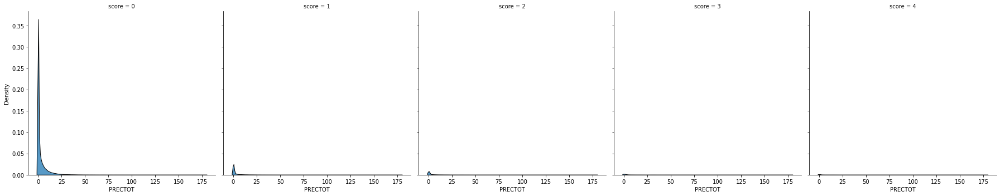

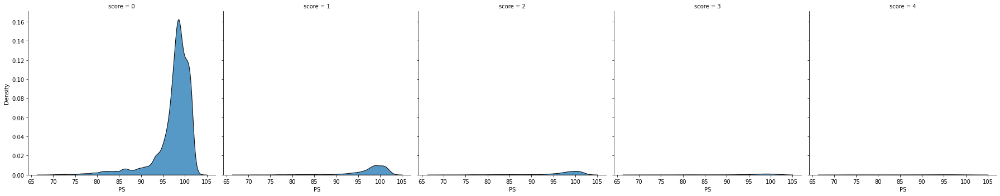

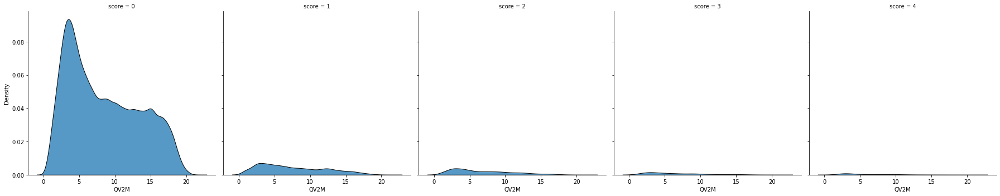

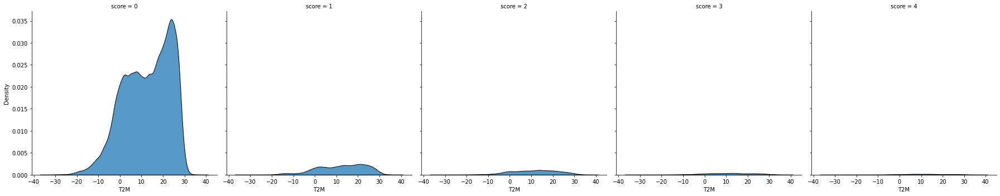

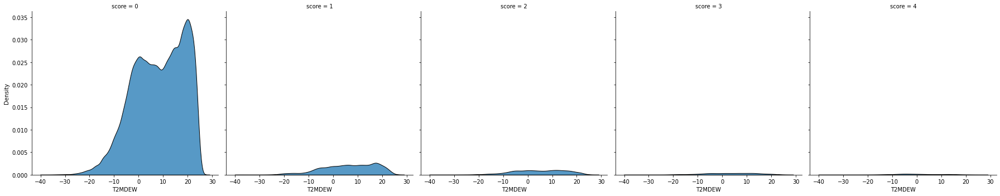

...

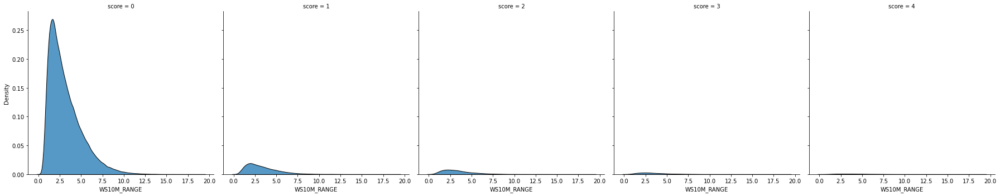

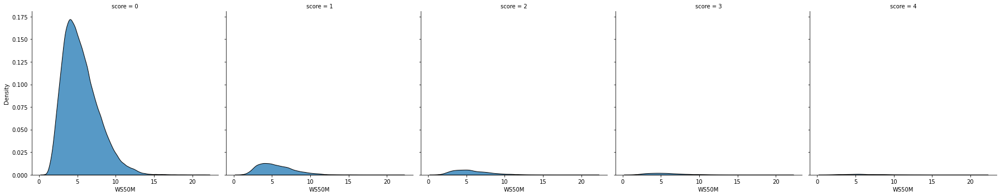

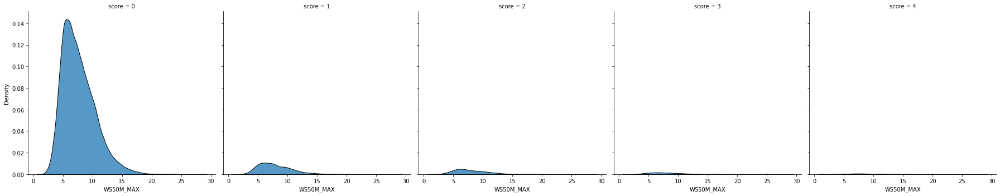

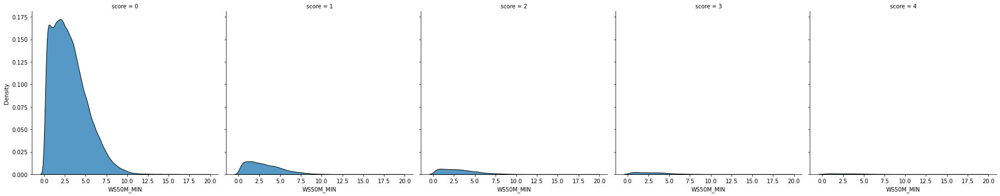

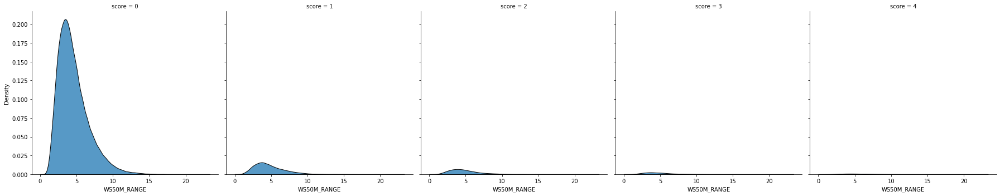

In [ ]:
# for column in train.drop(['fips', 'date', 'score', 'month'], axis=1).columns:
#   plot_dist(train, column, f'Distribusi kolom {column}')

for column in train.drop(['fips', 'date', 'score', 'month', 'state_code', 'climate_regions'], axis=1).columns:
  g = sns.displot(data=train, x=column, col='score', kind='kde', multiple='stack', palette='crest', fill=True)
  plt.tight_layout();

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



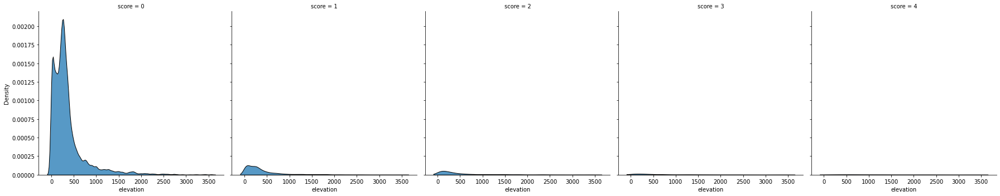

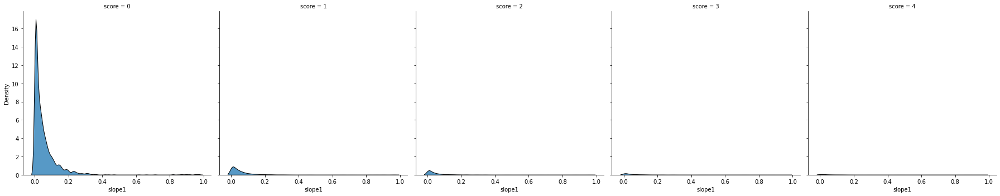

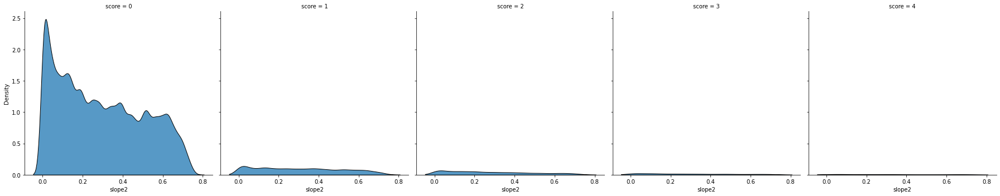

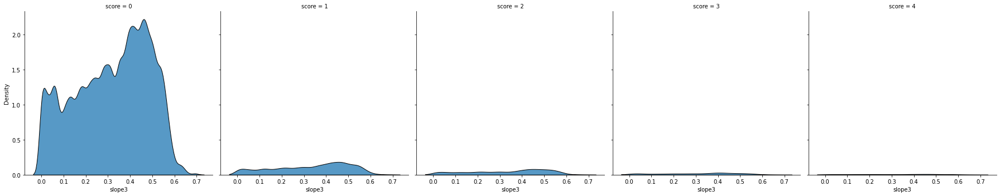

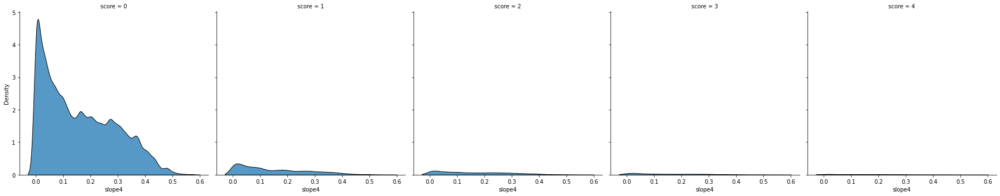

...

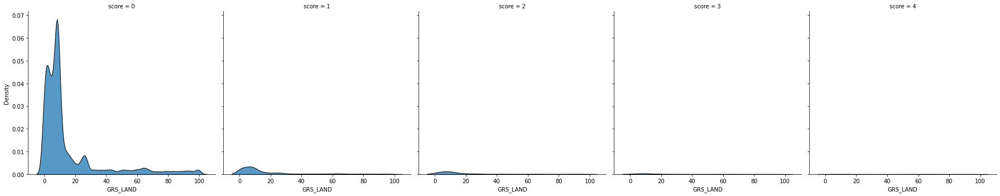

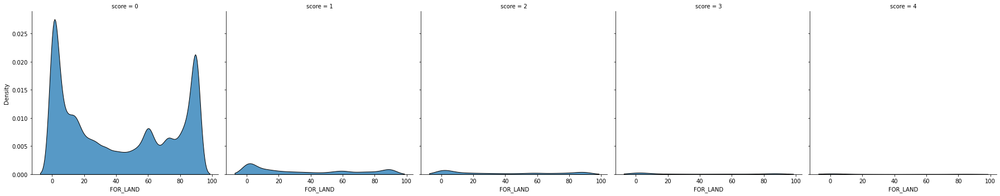

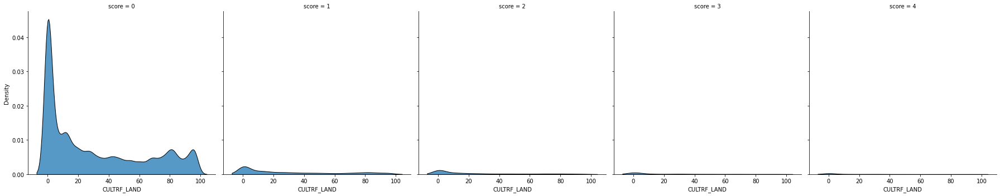

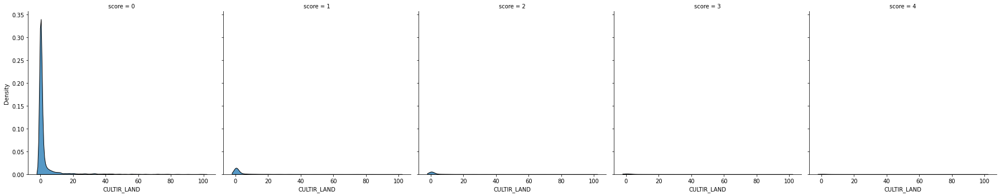

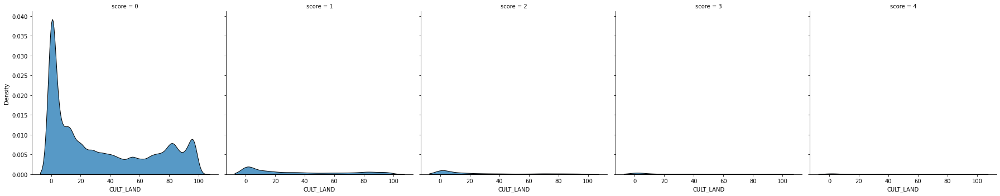

In [ ]:
for column in soil2.drop(['fips', 'date', 'score', 'lat', 'lon', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'], axis=1).columns:
  g = sns.displot(data=soil2, x=column, col='score', kind='kde', multiple='stack', palette='crest', fill=True)
  plt.tight_layout()

### Penggabungan kategori
menjadi 2 level ('NO Drought (0)' dan 'Drought (1)')

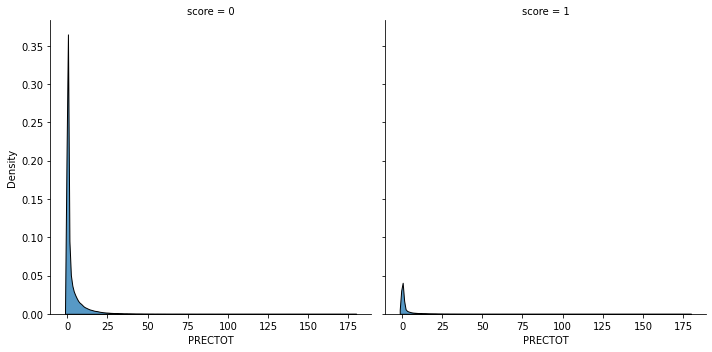

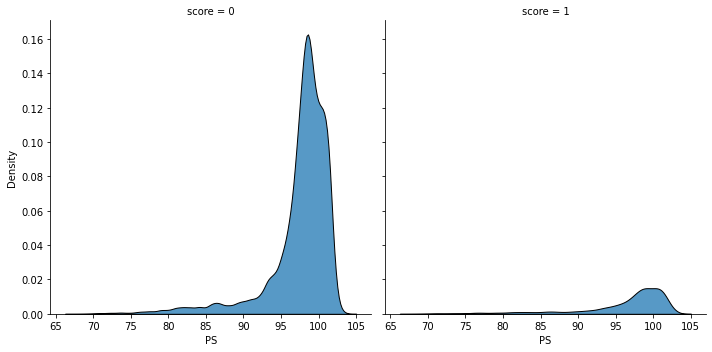

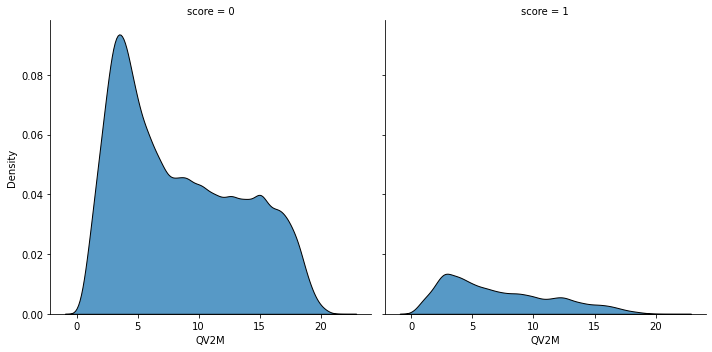

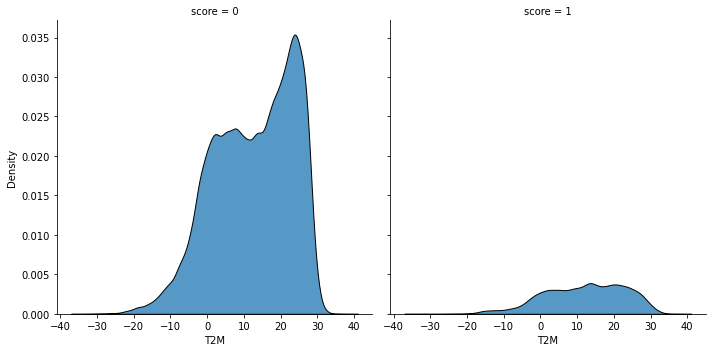

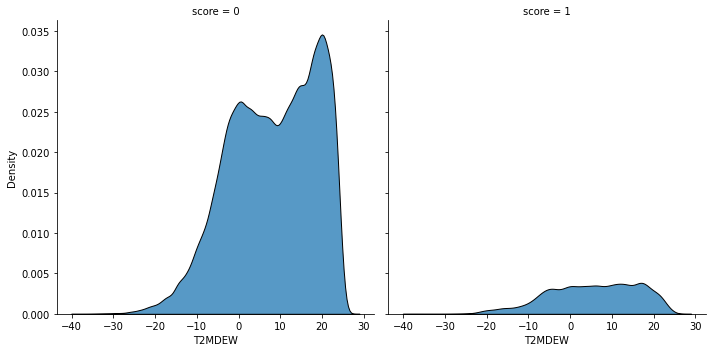

...

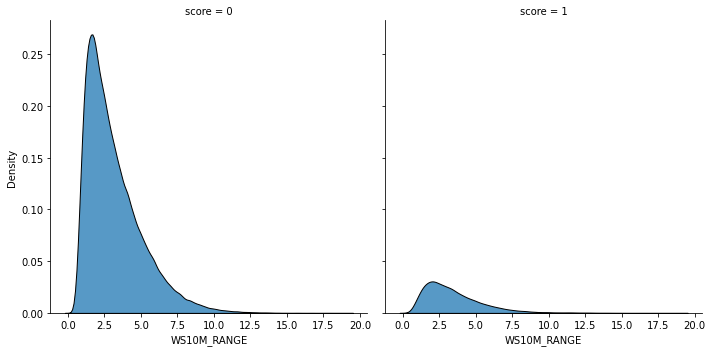

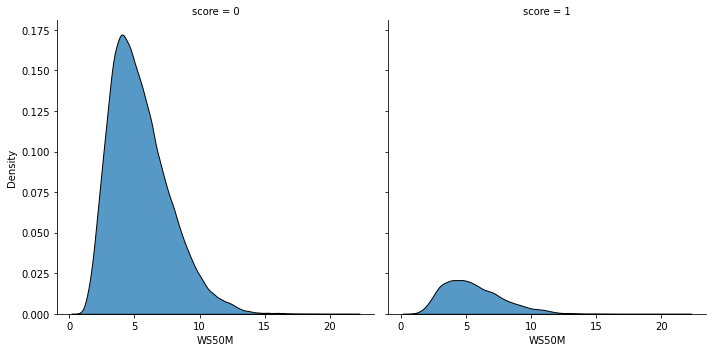

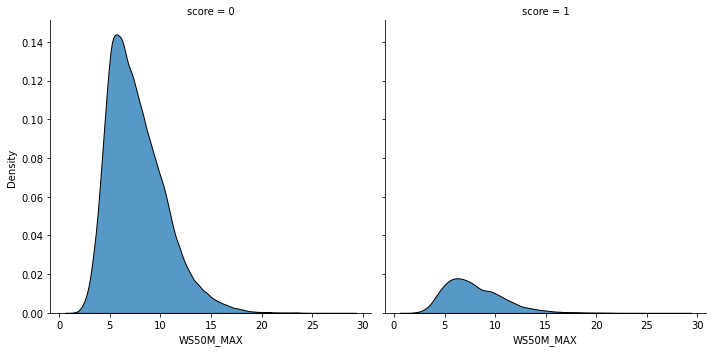

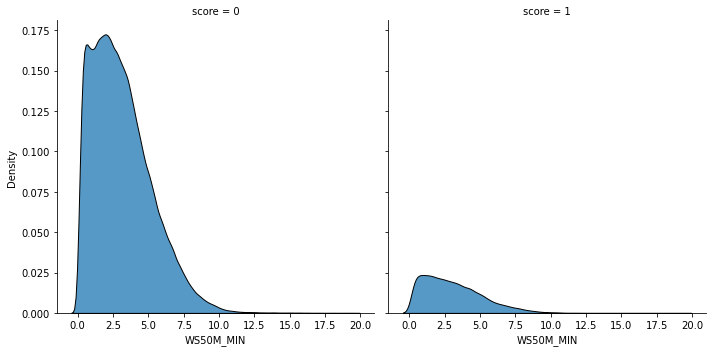

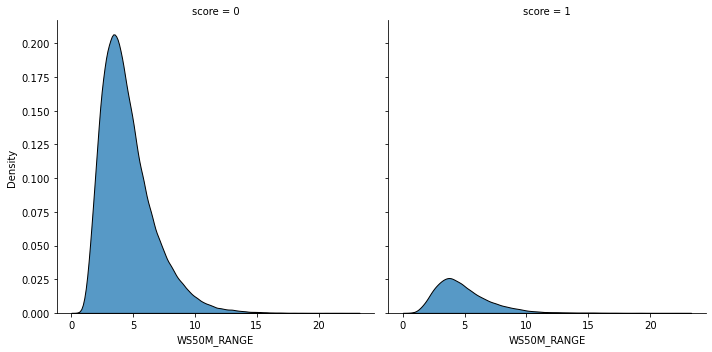

In [ ]:
# for column in train.drop(['fips', 'date', 'score', 'day', 'month'], axis=1).columns:
#   plot_dist(merge_train_cat, column, f'Distribusi kolom {column}', cat_type='other')
for column in merge_train_cat.drop(['fips', 'date', 'score', 'month', 'state_code', 'climate_regions'], axis=1).columns:
  g = sns.displot(data=merge_train_cat, x=column, col='score', kind='kde', multiple='stack', palette='crest', fill=True)
  plt.tight_layout();

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



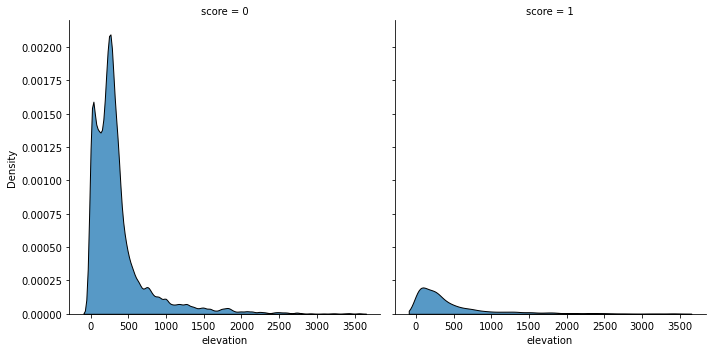

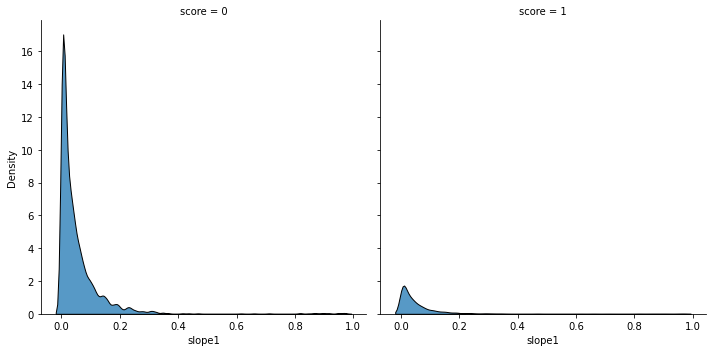

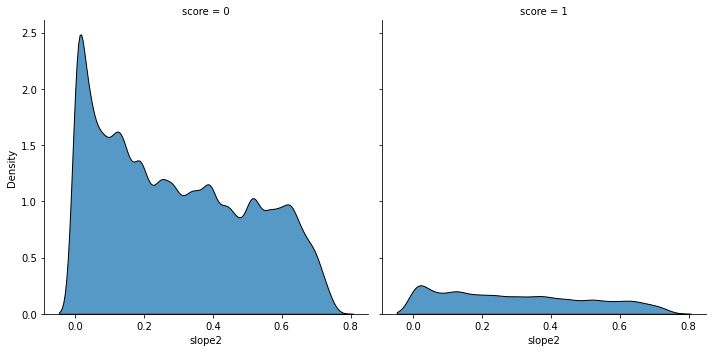

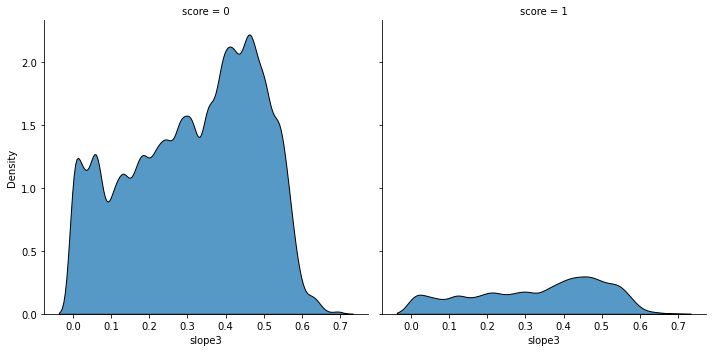

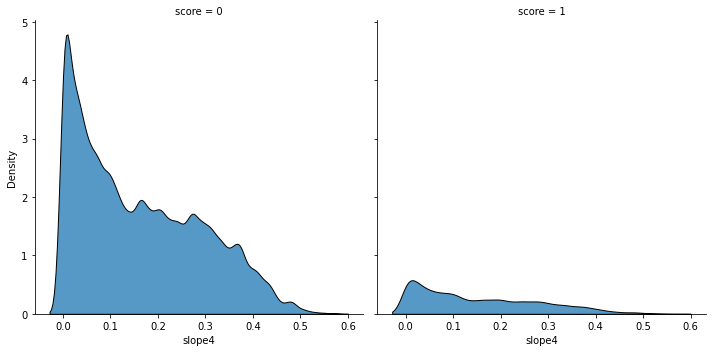

...

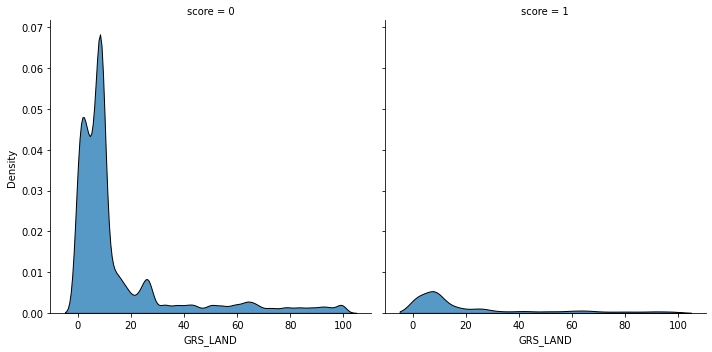

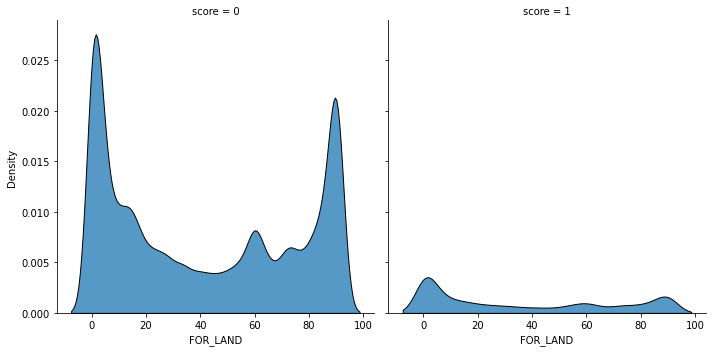

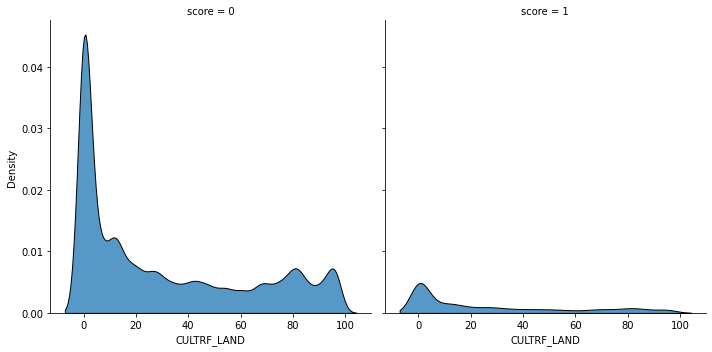

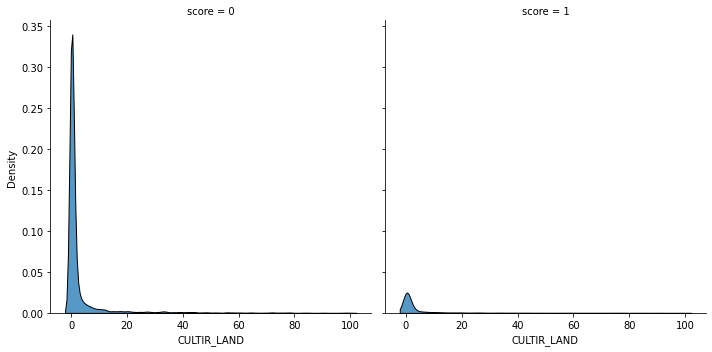

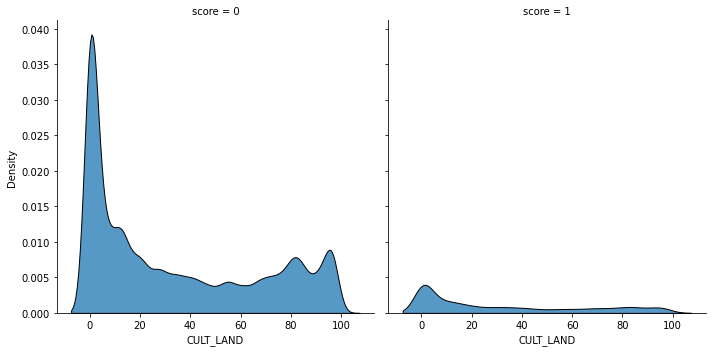

In [ ]:
for column in merge_soil_cat.drop(['fips', 'date', 'score', 'lat', 'lon', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'], axis=1).columns:
  g = sns.displot(data=merge_soil_cat, x=column, col='score', kind='kde', multiple='stack', palette='crest', fill=True)
  plt.tight_layout();

## Korelasi antar kolom continous vs continous

terlihat ada beberapa antar kolom memiliki korelasi mendekati juga sama dengan -1 atau 1 dan hal ini menjadi multicollinearity (namun pada model nanti asumsi terhadapnya tidak akan berpengaruh apa2)

In [ ]:
corr_df = train.drop(['fips', 'date','score', 'month', 'state_code', 'climate_regions'], axis=1).corr(method='spearman')
corr_df = corr_df.sort_values(by='TS', ascending=False).sort_values(by='TS', ascending=False, axis=1)

# fig = go.Figure(go.Heatmap(
#     z=corr_df.values,
#     x=corr_df.columns.tolist(),
#     y=corr_df.columns.tolist(),
#     colorscale='ylgnbu'))

fig = ff.create_annotated_heatmap(
    z=corr_df.values,
    x=corr_df.columns.tolist(),
    y=corr_df.columns.tolist(), 
    annotation_text=corr_df.values.round(2),
    colorscale='ylgnbu')

fig.update_layout(
    title='Spearman Correlation',
    showlegend = False,
    width = 950, height = 750,
    autosize = False)

fig.update_xaxes(side='bottom')

fig.show()

In [ ]:
corr_df = soil2.drop(['fips', 'date', 'score', 'lat', 'lon', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'], axis=1).corr(method='spearman')
corr_df = corr_df.sort_values(by='elevation', ascending=False).sort_values(by='elevation', ascending=False, axis=1)

# fig = go.Figure(go.Heatmap(
#     z=corr_df.values,
#     x=corr_df.columns.tolist(),
#     y=corr_df.columns.tolist(),
#     colorscale='ylgnbu'))

fig = ff.create_annotated_heatmap(
    z=corr_df.values,
    x=corr_df.columns.tolist(),
    y=corr_df.columns.tolist(), 
    annotation_text=corr_df.values.round(2),
    colorscale='pubugn')

fig.update_layout(
    title='Spearman Correlation',
    showlegend = False,
    width = 1050, height = 750,
    autosize = False)

fig.update_xaxes(side='bottom')

fig.show()

## Korelasi antara kolom continous vs response variable

ANOVA test
- H0 (Null Hypothesis) = Feature NOT importance
- H1 (Alternate Hypothesis) = Feature IS importance

we analyse the pvalue, lets say for confidence interval of 95%, significance level = 5%

```
if pvalue>0.05 = terima null hypothesis and if pvalue<0.05 = tolak null hypothesis
```

<small>hasilnya: penting semua</small>

In [ ]:
full_train.columns

Index(['fips', 'date', 'PRECTOT', 'PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET',
       'T2M_MAX', 'T2M_MIN', 'T2M_RANGE', 'TS', 'WS10M', 'WS10M_MAX',
       'WS10M_MIN', 'WS10M_RANGE', 'WS50M', 'WS50M_MAX', 'WS50M_MIN',
       'WS50M_RANGE', 'score', 'month', 'state_code', 'climate_regions', 'lat',
       'lon', 'elevation', 'slope1', 'slope2', 'slope3', 'slope4', 'slope5',
       'slope6', 'slope7', 'slope8', 'aspectN', 'aspectE', 'aspectS',
       'aspectW', 'aspectUnknown', 'WAT_LAND', 'NVG_LAND', 'URB_LAND',
       'GRS_LAND', 'FOR_LAND', 'CULTRF_LAND', 'CULTIR_LAND', 'CULT_LAND',
       'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'],
      dtype='object')

In [ ]:
numerics = ['PRECTOT', 'PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET',
       'T2M_MAX', 'T2M_MIN', 'T2M_RANGE', 'TS', 'WS10M', 'WS10M_MAX',
       'WS10M_MIN', 'WS10M_RANGE', 'WS50M', 'WS50M_MAX', 'WS50M_MIN',
       'WS50M_RANGE', 'elevation','slope1', 'slope2', 'slope3', 'slope4', 
       'slope5', 'slope6', 'slope7', 'slope8', 'aspectN', 'aspectE', 
       'aspectS', 'aspectW', 'aspectUnknown', 'WAT_LAND', 'NVG_LAND', 
       'URB_LAND', 'GRS_LAND', 'FOR_LAND', 'CULTRF_LAND', 'CULTIR_LAND', 'CULT_LAND']

xnum = full_train[numerics]
y = full_train.loc[:, 'score']

from sklearn.feature_selection import f_classif
fval, pfval = f_classif(xnum,y)
# for i in range(len(numerics)):print(numerics[i],pval[i])

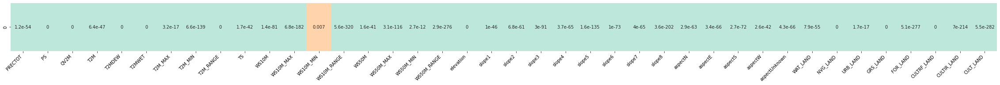

In [ ]:
plt.subplots(1, figsize=(40,2))
sns.heatmap(pfval.reshape(40, 1).T, cmap='icefire', annot=True, cbar=False)
plt.gca().set_xticklabels(xnum.columns, rotation=45, ha='right');

## Korelasi antara kolom categorical vs response variable

chi square test
- H0 (Null Hypothesis) = Feature NOT importance
- H1 (Alternate Hypothesis) = Feature IS importance

we analyse the pvalue, lets say for confidence interval of 95%, significance level = 5%

```
if pvalue>0.05 = terima null hypothesis and if pvalue<0.05 = tolak null hypothesis
```

<small>hasilnya: penting semua</small>

In [ ]:
categories = ['fips', 'state_code', 'climate_regions','month', 'lat', 'lon', 'SQ1', 'SQ2', 
              'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7']

xcatt = full_train.loc[:, categories]
y = full_train.loc[:, 'score']

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import chi2

cval, pcval = [], []
for col in categories:
    xcat = LabelEncoder().fit_transform(full_train[col]).reshape(-1,1)
    pcval.append(chi2(xcat,y)[1])
    # print(col,pval)

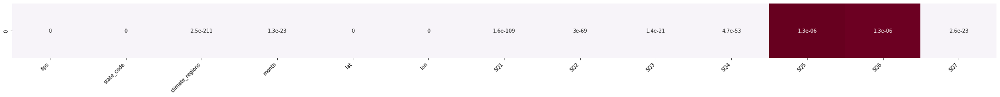

In [ ]:
plt.subplots(1, figsize=(35,2))
sns.heatmap(np.array(pcval).reshape(-1, 1).T, cmap='PuRd', annot=True, cbar=False)
plt.gca().set_xticklabels(xcatt.columns, rotation=45, ha='right');

# 4.&nbsp;*Data Wrangling*

## Menjadikan kategori hanya dua 
yaitu 'No Drought' dari sebelumnya 'D0' dengan lambang '0' yang menandakan keadaan tidak kekeringan akut (masih tahap awal atau sudah mulai membaik) dan 'Drought' dari sebelumnya yang memiliki tingkatan sebanyak empat (D1-D4).

<small>telah dilakukan sebelumnya pada bagian ```data preprocessing```</small>

In [ ]:
merge_full_cat.score.value_counts()

0    414106
1     53858
Name: score, dtype: int64

In [ ]:
merge_full_cat.shape

(467964, 55)

In [ ]:
# train_df = merge_train_cat.copy()
# soil_df = merge_soil_cat.copy()
full_train_df = merge_full_cat.copy()

## Membagi dataset
* untuk menyiapkan data validasi dengan proporsi sekitar 3% dari total dataset awal (dibagi manual dengan mengambil waktu dua bulan paling terakhir)
* melakukan pemilihan terhadap kolom untuk dilakukan train pada model

In [ ]:
(full_train_df[full_train_df.date > '2020-10-31']).shape

(15669, 55)

In [ ]:
15669/467964*100

3.3483344872682514

In [ ]:
date_slice = '2020-10-31'
train_new = full_train_df[full_train_df.date <= date_slice].reset_index(drop=True)
valid_df = full_train_df[full_train_df.date > date_slice].reset_index(drop=True)
train_new.shape, valid_df.shape

((452295, 55), (15669, 55))

In [ ]:
train_new.score.value_counts()

0    401822
1     50473
Name: score, dtype: int64

In [ ]:
X_train = train_new.drop(['fips', 'date','score', 'lat', 'lon', 'state_code'], axis=1)
y_train = train_new[['score']]
X_valid = valid_df.drop(['fips', 'date','score', 'lat', 'lon', 'state_code'], axis=1)
y_valid = valid_df[['score']]

## Ubah kolom categorical menjadi tipe angka (jika belum)

In [ ]:
from sklearn.preprocessing import LabelEncoder

lnd = LabelEncoder()
X_train.loc[:, 'climate_regions'] = lnd.fit_transform(X_train.loc[:, 'climate_regions'])
X_valid.loc[:, 'climate_regions'] = lnd.transform(X_valid.loc[:, 'climate_regions'])

## Menghilangkan *Outliers*
dengan menghitung jarak terhadap *neighbors* terdekat yang dimiliki suatu data point <sup>[source](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html?highlight=outlier#sklearn.neighbors.LocalOutlierFactor)</sup>

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(metric='manhattan')
lof_arr = lof.fit_predict(X_train.drop(['climate_regions', 'month', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'], axis=1))
sliced = lof_arr != -1
X_train, y_train = X_train.loc[sliced, :].reset_index(drop=True), y_train.loc[sliced].reset_index(drop=True)
X_train.shape

(448468, 49)

## *Handling Imbalanced Dataset*
pada setiap kategori di dataset berada pada tingkat ketidakseimbangan 'moderate' jika mengacu pada informasi [berikut](https://developers.google.com/machine-learning/data-prep/construct/sampling-splitting/imbalanced-data)

In [ ]:
X_train.columns

Index(['PRECTOT', 'PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET', 'T2M_MAX',
       'T2M_MIN', 'T2M_RANGE', 'TS', 'WS10M', 'WS10M_MAX', 'WS10M_MIN',
       'WS10M_RANGE', 'WS50M', 'WS50M_MAX', 'WS50M_MIN', 'WS50M_RANGE',
       'month', 'climate_regions', 'elevation', 'slope1', 'slope2', 'slope3',
       'slope4', 'slope5', 'slope6', 'slope7', 'slope8', 'aspectN', 'aspectE',
       'aspectS', 'aspectW', 'aspectUnknown', 'WAT_LAND', 'NVG_LAND',
       'URB_LAND', 'GRS_LAND', 'FOR_LAND', 'CULTRF_LAND', 'CULTIR_LAND',
       'CULT_LAND', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7'],
      dtype='object')

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

rdus = RandomOverSampler(random_state=233, sampling_strategy=.8)
X_res_base, y_res_base = rdus.fit_resample(X_train, y_train.loc[:, 'score'])
Counter(y_res_base)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



Counter({0: 398818, 1: 319054})

In [ ]:
398818*.8, 319054/.9

(319054.4, 354504.44444444444)

### OverSampling (SMOTENC)
SMOTE untuk nominal dan continuos variables

In [ ]:
from collections import Counter
from imblearn.over_sampling import SMOTENC

cat_feat = [18, 19, 42, 43, 44, 45, 46, 47, 48]
smtc = SMOTENC(random_state=233, categorical_features=cat_feat, sampling_strategy=.8)
X_res, y_res = smtc.fit_resample(X_train, y_train.loc[:, 'score'])
Counter(y_res)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



Counter({0: 398818, 1: 319054})

### UnderSampling (TOMEK)

In [ ]:
from imblearn.under_sampling import TomekLinks

tmk = TomekLinks(random_state=233, sampling_strategy={0: 354504, 1:319054})
X_res4, y_res4 = tmk.fit_resample(X_res, y_res)
Counter(y_res4)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



Counter({0: 394488, 1: 314724})

In [ ]:
xval = X_valid.copy()
xval.loc[:, 'score'] = y_valid.values
xval.to_csv('valid.csv', index=False)

smtc_df = pd.DataFrame(X_res)
smtc_df.columns = X_train.columns
smtc_df.loc[:, 'score'] = y_res
smtc_df.to_csv('smotenc-train.csv', index=False)

tomek_df = pd.DataFrame(X_res4)
tomek_df.columns = X_train.columns
tomek_df.loc[:, 'score'] = y_res4
tomek_df.to_csv('smotenc-tomek-train.csv', index=False)

## Scaling Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_res4)
X_valid_scaled = scaler.transform(X_valid.values)

# 5.&nbsp;*Modelling*

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

rdm_stt = 233


logc = LogisticRegression(random_state=rdm_stt, max_iter=1000)
mlpc = MLPClassifier(random_state=rdm_stt, batch_size=10, 
                     solver='adam', alpha=1e-5, 
                     hidden_layer_sizes=(5, 2), 
                     early_stopping=True)
sgdc = SGDClassifier(random_state=rdm_stt, loss='hinge', penalty='l2', early_stopping=True) #svm
lgbc = LGBMClassifier(random_state=rdm_stt, boosting_type='goss')


lgbc.fit(X_train_scaled, y_res4)
logc.fit(X_train_scaled, y_res4)
mlpc.fit(X_train_scaled, y_res4) # long running time
sgdc.fit(X_train_scaled, y_res4)

# lgbc.fit(X_train.values, y_train.loc[:, 'score'].values)
# # xgbc.fit(X_train_scaled, y_res)
# # rfc.fit(X_train_scaled, y_res)
# knnc.fit(X_train.values, y_train.loc[:, 'score'].values)
# logc.fit(X_train.values, y_train.loc[:, 'score'].values)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=True, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=233, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [29]:
import joblib as jbb
jbb.dump(lgbc, 'lgb_model.joblib') 
jbb.dump(mlpc, 'mlp_model.joblib')
jbb.dump(sgdc, 'sgd_model.joblib')
jbb.dump(logc, 'log_model.joblib')

# lgbc = jbb.load('lgb_model.joblib')

In [ ]:
# ground truth data validation
y_val = y_valid.loc[:, 'score'].values
cat_new2 = ['NO Drought', 'Drought']

from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

def metrics_all(y_true, y_pred):
  mtd = 'weighted'
  accuracy = accuracy_score(y_true, y_pred)
  precision = precision_score(y_true, y_pred, average=mtd)
  recall = recall_score(y_true, y_pred, average=mtd)
  f1_metrics = f1_score(y_true, y_pred, average=mtd)
  roc_auc = roc_auc_score(y_true, y_pred)

  return accuracy, precision, recall, f1_metrics, roc_auc

def metrics_table(y_true, y_pred):
  metrics_name = pd.DataFrame(['accuracy', 'precision', 'recall', 'f1_score', 'roc_auc'], columns=['metrics'])

  metrics_df = pd.DataFrame(metrics_all(y_true, y_pred), columns=['score'])
  metrics_df = pd.concat([metrics_name, metrics_df], axis=1)
  metrics_df.append(['average'])
  avg_df = pd.DataFrame({
      'metrics': 'average',
      'score': [metrics_df.loc[:, 'score'].mean()]
      })
  metrics_df = pd.concat([metrics_df, avg_df], axis=0).reset_index(drop=True)
  metrics_df = metrics_df.set_index('metrics')
  return metrics_df

## Base Model (Logistic Regression)

In [ ]:
# logistic regression evaluation
y_pred = logc.predict(X_valid_scaled)

log_met = metrics_table(y_val, y_pred)
log_met

,score
metrics,
accuracy,0.491991
precision,0.673602
recall,0.491991
f1_score,0.535006
roc_auc,0.517417
average,0.542001


## Perbandingan beberapa Model

In [ ]:
# lightgbm evaluation
y_pred = lgbc.predict(X_valid_scaled)
lgb_met = metrics_table(y_val, y_pred)

# mlp evaluation
y_pred = mlpc.predict(X_valid_scaled)
mlp_met = metrics_table(y_val, y_pred)

# svm(sgd) evaluation
y_pred = sgdc.predict(X_valid_scaled)
sgd_met = metrics_table(y_val, y_pred)

# full report evaluation
full_report = pd.concat([log_met, lgb_met, mlp_met, sgd_met], axis=1)
full_report.columns = ['logistic regression', 'lightgbm', 'multi-layer perceptron', 'svm (sgd)']
full_report

,logistic regression,lightgbm,multi-layer perceptron,svm (sgd)
metrics,,,,
accuracy,0.491991,0.755185,0.631183,0.621737
precision,0.673602,0.743713,0.692587,0.679170
recall,0.491991,0.755185,0.631183,0.621737
f1_score,0.535006,0.748831,0.655145,0.645007
roc_auc,0.517417,0.615081,0.550654,0.528900
average,0.542001,0.723599,0.632150,0.619310


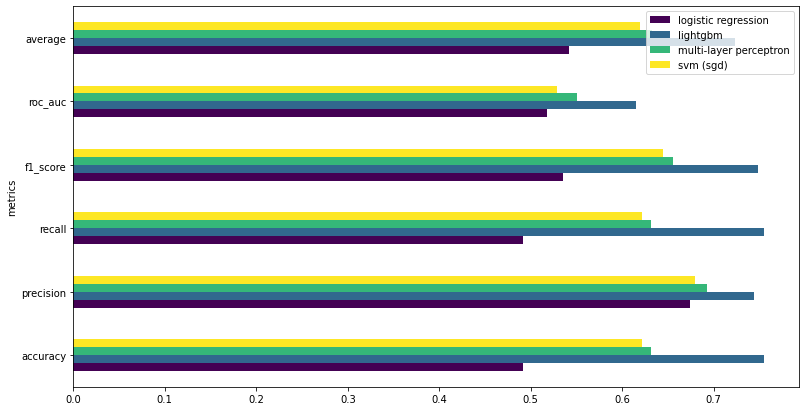

In [ ]:
full_report.plot(kind='barh', figsize=(13,7), cmap='viridis');

In [ ]:
lgbc

LGBMClassifier(boosting_type='goss', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=233, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

## Pengembangan Model (LightGBM)

### Hyperparameter Tuning (Bayesian Optimization)

In [ ]:
import time
import pprint
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_objective, plot_histogram
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from sklearn.metrics import make_scorer
from sklearn.model_selection import StratifiedKFold

# Reporting util for different optimizers
def report_perf(optimizer, X, y, title='model', callbacks=None):
  """
  A wrapper for measuring time and performances of different optmizers
  
  optimizer = a sklearn or a skopt optimizer
  X = the training set 
  y = our target
  title = a string label for the experiment
  """
  start = time.time()
  
  if callbacks is not None:
    optimizer.fit(X, y, callback=callbacks)
  else:
    optimizer.fit(X, y)
      
  d=pd.DataFrame(optimizer.cv_results_)
  best_score = optimizer.best_score_
  best_score_std = d.iloc[optimizer.best_index_].std_test_score
  best_params = optimizer.best_params_
  
  time_total = time.time() - start
  size_len = len(optimizer.cv_results_['params'])

  print(f'{title} took {time_total} seconds, candidates checked: {size_len},\
  best CV score: {best_score}', end=' ')
  print(u'\u00B1', end=' ')
  print(f'{best_score_std}')

  print('Best parameters:')
  pprint.pprint(best_params)
  print()
  return best_params

roc_auc = make_scorer(roc_auc_score, greater_is_better=True, needs_threshold=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=rdm_stt)

lgbc_tune = LGBMClassifier(
    random_state=rdm_stt,
    boosting_type='goss',
    objective='binary',
    n_jobs=1,
    verbose=-1) 

### Define Search Spaces (for tuning)

In [ ]:
search_spaces = {
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),     # Boosting learning rate
    'n_estimators': Integer(30, 5000),                   # Number of boosted trees to fit
    'num_leaves': Integer(2, 512),                       # Maximum tree leaves for base learners
    'max_depth': Integer(-1, 256),                       # Maximum tree depth for base learners, <=0 means no limit
    'min_child_samples': Integer(1, 256),                # Minimal number of data in one leaf
    'max_bin': Integer(100, 1000),                       # Max number of bins that feature values will be bucketed
    'subsample': Real(0.01, 1.0, 'uniform'),             # Subsample ratio of the training instance
    'colsample_bytree': Real(0.01, 1.0, 'uniform'),      # Subsample ratio of columns when constructing each tree
    'min_child_weight': Real(0.01, 10.0, 'uniform'),     # Minimum sum of instance weight (hessian) needed in a child (leaf)
    'reg_lambda': Real(1e-9, 100.0, 'log-uniform'),      # L2 regularization
    'reg_alpha': Real(1e-9, 100.0, 'log-uniform'),       # L1 regularization
    'scale_pos_weight': Real(1.0, 500.0, 'uniform'),     # Weighting of the minority class (Only for binary classification)
        }

opt = BayesSearchCV(
    estimator=lgbc_tune,
    search_spaces=search_spaces,
    cv=skf,      
    n_iter=300,   
    n_points=3,
    n_jobs=-1,    
    iid=False,    
    return_train_score=False,  
    refit=False,   
    optimizer_kwargs={'base_estimator': 'GP'},
    random_state=rdm_stt
    )                                   

/usr/local/lib/python3.7/dist-packages/skopt/searchcv.py:300: UserWarning: The `iid` parameter has been deprecated and will be ignored.
  warnings.warn("The `iid` parameter has been deprecated "


### Proses Tuning

In [ ]:
# callbacks for tuning
overdone_control = DeltaYStopper(delta=0.0001)              
time_limit_control = DeadlineStopper(total_time=60 * 30) #time limit 30 minutes

# tuning process
best_params = report_perf(opt, X_train_scaled, y_res4, 'LightGBM', 
                          callbacks=[overdone_control, time_limit_control])

LightGBM took 3849.860622882843 seconds, candidates checked: 3,  best CV score: 0.9956390415123073 ± 0.00011718449112101673
Best parameters:
OrderedDict([('colsample_bytree', 0.6934365185704549),
             ('learning_rate', 0.4769399561694453),
             ('max_bin', 147),
             ('max_depth', 167),
             ('min_child_samples', 134),
             ('min_child_weight', 2.30062948715922),
             ('n_estimators', 1945),
             ('num_leaves', 352),
             ('reg_alpha', 0.0008806803242131921),
             ('reg_lambda', 8.559298421774295e-05),
             ('scale_pos_weight', 66.18999793786075),
             ('subsample', 0.9238021141117401)])



In [ ]:
new_params = best_params.copy()
new_params['random_state'] = rdm_stt
new_params['boosting_type'] = 'goss'
new_params['objective'] = 'binary'
new_params['n_jobs'] = 1
new_params['verbose'] = -1 

lgbc_best = LGBMClassifier(**new_params)
lgbc_best

LGBMClassifier(boosting_type='goss', class_weight=None,
               colsample_bytree=0.6934365185704549, importance_type='split',
               learning_rate=0.4769399561694453, max_bin=147, max_depth=167,
               min_child_samples=134, min_child_weight=2.30062948715922,
               min_split_gain=0.0, n_estimators=1945, n_jobs=1, num_leaves=352,
               objective='binary', random_state=233,
               reg_alpha=0.0008806803242131921,
               reg_lambda=8.559298421774295e-05,
               scale_pos_weight=66.18999793786075, silent=True,
               subsample=0.9238021141117401, subsample_for_bin=200000,
               subsample_freq=0, verbose=-1)

### Train New Model

In [ ]:
# after tuning
lgbc_best.fit(X_train_scaled, y_res4)

LGBMClassifier(boosting_type='goss', class_weight=None,
               colsample_bytree=0.6934365185704549, importance_type='split',
               learning_rate=0.4769399561694453, max_bin=147, max_depth=167,
               min_child_samples=134, min_child_weight=2.30062948715922,
               min_split_gain=0.0, n_estimators=1945, n_jobs=1, num_leaves=352,
               objective='binary', random_state=233,
               reg_alpha=0.0008806803242131921,
               reg_lambda=8.559298421774295e-05,
               scale_pos_weight=66.18999793786075, silent=True,
               subsample=0.9238021141117401, subsample_for_bin=200000,
               subsample_freq=0, verbose=-1)

# 6.&nbsp;Evaluation (Last)

In [ ]:
y_pred = lgbc_best.predict(X_valid_scaled)
lgb_met2 = metrics_table(y_val, y_pred)
lgb_met2

,score
metrics,
accuracy,0.732912
precision,0.713399
recall,0.732912
f1_score,0.721885
roc_auc,0.570164
average,0.694254


## Perbandingan hasil seluruh model

In [ ]:
# full report evaluation with developed model
full_report = pd.concat([log_met, lgb_met, mlp_met, sgd_met, lgb_met2], axis=1)
full_report.columns = ['logistic regression', 'lightgbm', 'multi-layer perceptron', 'svm (sgd)', 'lightgbm kembangan']
full_report

,logistic regression,lightgbm,multi-layer perceptron,svm (sgd),lightgbm kembangan
metrics,,,,,
accuracy,0.491991,0.755185,0.631183,0.621737,0.732912
precision,0.673602,0.743713,0.692587,0.679170,0.713399
recall,0.491991,0.755185,0.631183,0.621737,0.732912
f1_score,0.535006,0.748831,0.655145,0.645007,0.721885
roc_auc,0.517417,0.615081,0.550654,0.528900,0.570164
average,0.542001,0.723599,0.632150,0.619310,0.694254


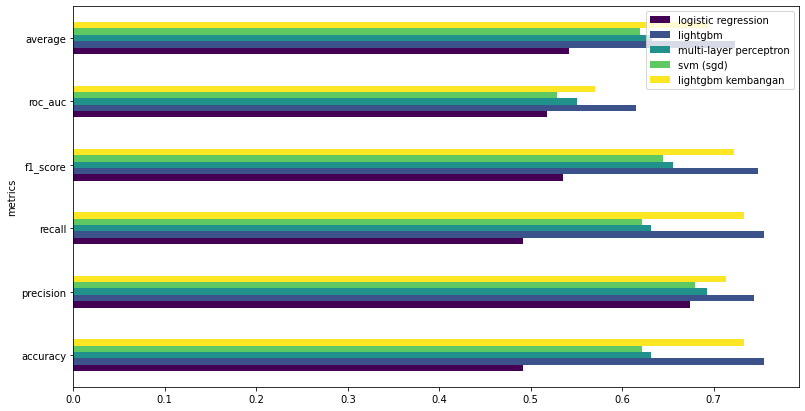

In [ ]:
full_report.plot(kind='barh', figsize=(13,7), cmap='viridis');

## Contoh hasil prediksi model terbaik

In [ ]:
real_data = np.array([
     [.134442, 87.0, 7.89, .67, -6.123, 17, 8.88, 44.11, 13.87, -2.003, 7.671447, 
      0.76, 2.556, 5.687, 21.99, 5.175, 4.35, 0.0835, 12.0, 7.0, 63.0, 0.0419, 0.2788,
      0.64889, 0.09546, 0.01346, 0.0, 0.0, 0.0, 0.04664, 0.051365, 0.038942, 
      0.048271, 0.814775, 0.0, 1.3,	47.0116, 26.146481, 6.11147,	20.294, 
      .148478, 20.720772, 3.0, 3.0, 5.0, 1.0, 1.0, 7.0, 2.0],
      [0.27,104.47,5.31,6.17,4.82,5.49,11.1,1.58,9.52,6.08,4.29,5.78,2.87,2.91,
       6.73,9.63,3.3,6.33,12.0,4.0,68.0,0.113,0.5807,0.2831,0.0232,0.0,0.0,0.0,
       0.0,0.0658,0.0877,0.0693,0.0835,0.6937,0.0,0.0,0.1197,1.1195,3.4637,
       39.9867,56.1409,95.3065,1.0,3.0,1.0,2.0,1.0,1.0,1.0],
      [0.0,98.09,4.0,3.58,0.41,1.99,8.37,-1.54,9.91,3.17,3.21,4.68,1.72,2.96,
       6.59,8.38,4.21,4.18,12.0,5.0,277.0,0.0044,0.0496,0.2307,0.454,0.2076,
       0.0536,0.001,0.0,0.208,0.2011,0.2604,0.2765,0.051,0.0,0.0,1.691757,
       18.9002,60.27426,17.936,1.096299,19.04106,3.0,2.0,1.0,1.0,1.0,1.0,1.0]
       ])

real_df = pd.DataFrame(real_data)
real_df.columns = X_valid.columns
real_df.shape

(3, 49)

In [ ]:
real_data_scaled = scaler.transform(real_data)

real_pred = lgbc.predict(real_data_scaled)

real_df.loc[:, 'class'] = real_pred
real_df.loc[:, 'class'] = real_df.loc[:, 'class'].apply(lambda x: 'Drought' if x==1 else 'NO Drought')

real_df

,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,month,climate_regions,elevation,slope1,slope2,slope3,slope4,slope5,slope6,slope7,slope8,aspectN,aspectE,aspectS,aspectW,aspectUnknown,WAT_LAND,NVG_LAND,URB_LAND,GRS_LAND,FOR_LAND,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7,class
0,0.134442,87.00,7.89,0.67,-6.123,17.00,8.88,44.11,13.87,-2.003,7.671447,0.76,2.556,5.687,21.99,5.175,4.35,0.0835,12.0,7.0,63.0,0.0419,0.2788,0.64889,0.09546,0.01346,0.0000,0.000,0.0,0.04664,0.051365,0.038942,0.048271,0.814775,0.0,1.3,47.011600,26.146481,6.11147,20.2940,0.148478,20.720772,3.0,3.0,5.0,1.0,1.0,7.0,2.0,Drought
1,0.270000,104.47,5.31,6.17,4.820,5.49,11.10,1.58,9.52,6.080,4.290000,5.78,2.870,2.910,6.73,9.630,3.30,6.3300,12.0,4.0,68.0,0.1130,0.5807,0.28310,0.02320,0.00000,0.0000,0.000,0.0,0.06580,0.087700,0.069300,0.083500,0.693700,0.0,0.0,0.119700,1.119500,3.46370,39.9867,56.140900,95.306500,1.0,3.0,1.0,2.0,1.0,1.0,1.0,NO Drought
2,0.000000,98.09,4.00,3.58,0.410,1.99,8.37,-1.54,9.91,3.170,3.210000,4.68,1.720,2.960,6.59,8.380,4.21,4.1800,12.0,5.0,277.0,0.0044,0.0496,0.23070,0.45400,0.20760,0.0536,0.001,0.0,0.20800,0.201100,0.260400,0.276500,0.051000,0.0,0.0,1.691757,18.900200,60.27426,17.9360,1.096299,19.041060,3.0,2.0,1.0,1.0,1.0,1.0,1.0,NO Drought


# Kesimpulan dan Future Improvement

Model yang dapat memprediksi tingkat kekeringan parah (*drought*) menunjukkan bahwa hasil terbaik diraih oleh model [LightGBM](https://lightgbm.readthedocs.io/en/latest/) tanpa adanya proses hyperparameter tuning. Namun, hasil tersebut menunjukkan bahwa masih dapat ditambahkannya penggunaan data (yaitu train) agar mendapatkan hasil lebih baik dan aman dari masalah data tidak seimbang. Serta, dapat melihat dan mencoba dengan model lain lagi atau menggunakan pendekatan hyperparameter tuning berbeda. 